# Insurance Claims- Fraud Detection
# Problem Statement:
# Business case:
*  Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

*  In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

*  In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

# Importing Required Libraries

In [1]:
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore

from sklearn.preprocessing import StandardScaler,power_transform,LabelEncoder,OrdinalEncoder,OneHotEncoder
from sklearn.linear_model import LogisticRegression,Lasso,Ridge
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier,BaggingClassifier
from sklearn.model_selection import train_test_split,cross_val_score,GridSearchCV
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,plot_roc_curve,roc_auc_score

import pickle
import warnings 
warnings.filterwarnings('ignore')

# Loading DataSet

In [2]:
df=pd.read_csv("Automobile_insurance_fraud.csv")
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


# EDA(Exploratory Data Analysis)

In [3]:
df.describe(include="all")   

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
count,1000.000000,1000.000000,1000.000000,1000,1000,1000,1000.000000,1000.000000,1.000000e+03,1000.000000,...,1000,1000.00000,1000.000000,1000.000000,1000.000000,1000,1000,1000.000000,1000,0.0
unique,NaN,NaN,NaN,951,3,3,NaN,NaN,NaN,NaN,...,3,NaN,NaN,NaN,NaN,14,39,NaN,2,NaN
top,NaN,NaN,NaN,01-01-2006,OH,250/500,NaN,NaN,NaN,NaN,...,?,NaN,NaN,NaN,NaN,Saab,RAM,NaN,N,NaN
freq,NaN,NaN,NaN,3,352,351,NaN,NaN,NaN,NaN,...,343,NaN,NaN,NaN,NaN,80,43,NaN,753,NaN
mean,203.954000,38.948000,546238.648000,NaN,NaN,NaN,1136.000000,1256.406150,1.101000e+06,501214.488000,...,NaN,52761.94000,7433.420000,7399.570000,37928.950000,NaN,NaN,2005.103000,NaN,NaN
std,115.113174,9.140287,257063.005276,NaN,NaN,NaN,611.864673,244.167395,2.297407e+06,71701.610941,...,NaN,26401.53319,4880.951853,4824.726179,18886.252893,NaN,NaN,6.015861,NaN,NaN
min,0.000000,19.000000,100804.000000,NaN,NaN,NaN,500.000000,433.330000,-1.000000e+06,430104.000000,...,NaN,100.00000,0.000000,0.000000,70.000000,NaN,NaN,1995.000000,NaN,NaN
25%,115.750000,32.000000,335980.250000,NaN,NaN,NaN,500.000000,1089.607500,0.000000e+00,448404.500000,...,NaN,41812.50000,4295.000000,4445.000000,30292.500000,NaN,NaN,2000.000000,NaN,NaN
50%,199.500000,38.000000,533135.000000,NaN,NaN,NaN,1000.000000,1257.200000,0.000000e+00,466445.500000,...,NaN,58055.00000,6775.000000,6750.000000,42100.000000,NaN,NaN,2005.000000,NaN,NaN
75%,276.250000,44.000000,759099.750000,NaN,NaN,NaN,2000.000000,1415.695000,0.000000e+00,603251.000000,...,NaN,70592.50000,11305.000000,10885.000000,50822.500000,NaN,NaN,2010.000000,NaN,NaN


*  The above table shows the described details of data

In [4]:
df.shape

(1000, 40)

* The given data has a 1000 rows and 40 columns 

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [6]:
df.dtypes        #To get data types

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

* The data has a both float and object type of values

# Finding null values

In [7]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

* Hence there is no null values in the data except _c39

# Correlation matrix

In [8]:
df.corr()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
months_as_customer,1.000000,0.922098,0.057555,0.026807,0.005018,0.015498,0.017895,0.006399,0.020209,0.070639,0.014736,-0.010162,0.058383,0.062108,0.065329,0.034940,0.061013,-0.000292,NaN
age,0.922098,1.000000,0.059413,0.029188,0.014404,0.018126,0.025604,-0.007075,0.007368,0.087161,0.022102,-0.015679,0.052359,0.069863,0.075522,0.060898,0.062588,0.001354,NaN
policy_number,0.057555,0.059413,1.000000,-0.006738,0.022566,0.008968,0.007083,0.009802,-0.005669,0.000113,0.013432,-0.004558,-0.012661,-0.018009,-0.008762,-0.010678,-0.020184,-0.000183,NaN
policy_deductable,0.026807,0.029188,-0.006738,1.000000,-0.003245,0.010870,0.004545,0.035212,-0.023544,0.060935,0.051214,-0.022765,0.066639,0.022839,0.039107,0.064792,0.005269,0.026105,NaN
policy_annual_premium,0.005018,0.014404,0.022566,-0.003245,1.000000,-0.006247,0.032354,-0.013738,0.023547,-0.001578,-0.045991,0.026780,0.002332,0.009094,-0.017633,-0.011654,0.020246,-0.049226,NaN
umbrella_limit,0.015498,0.018126,0.008968,0.010870,-0.006247,1.000000,0.019671,-0.047268,-0.024056,-0.023257,-0.021270,0.022743,-0.006738,-0.040344,-0.045412,-0.023790,-0.038584,0.009893,NaN
insured_zip,0.017895,0.025604,0.007083,0.004545,0.032354,0.019671,1.000000,0.006303,0.049372,0.008274,0.027448,0.028695,0.019805,-0.033873,-0.017495,-0.006841,-0.041083,-0.032736,NaN
capital-gains,0.006399,-0.007075,0.009802,0.035212,-0.013738,-0.047268,0.006303,1.000000,-0.046904,-0.016406,0.061643,0.055829,-0.017651,0.015980,0.025934,-0.000779,0.015836,0.031398,NaN
capital-loss,0.020209,0.007368,-0.005669,-0.023544,0.023547,-0.024056,0.049372,-0.046904,1.000000,-0.025054,-0.014895,-0.024418,-0.041330,-0.036060,-0.046060,-0.022863,-0.032665,-0.056615,NaN
incident_hour_of_the_day,0.070639,0.087161,0.000113,0.060935,-0.001578,-0.023257,0.008274,-0.016406,-0.025054,1.000000,0.120794,-0.034563,0.006527,0.217702,0.165768,0.179536,0.215626,0.021368,NaN


Text(0.5, 1.0, 'Correlation matrix')

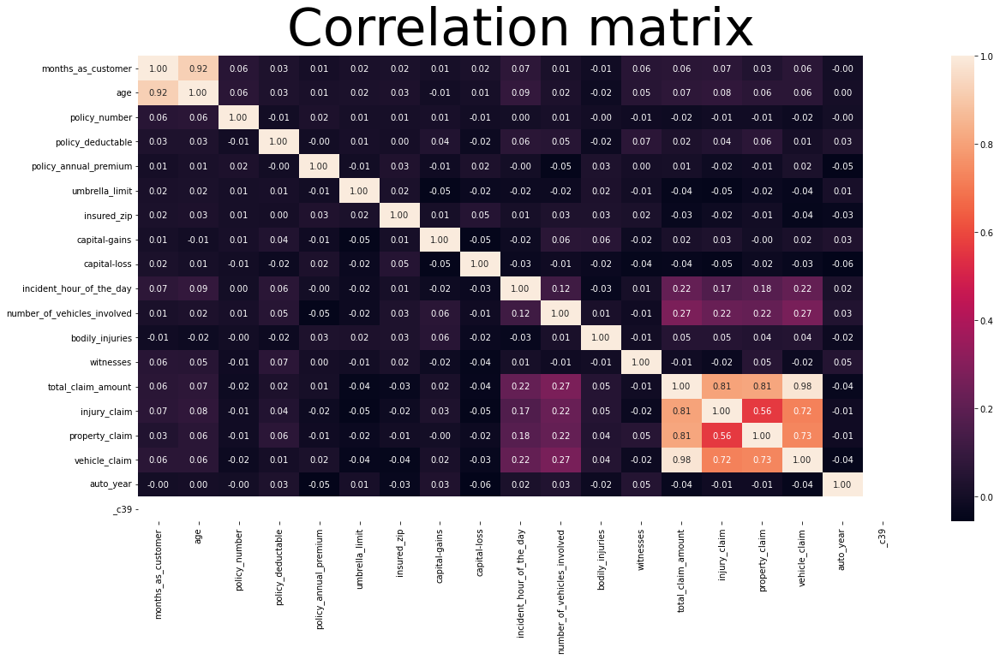

In [9]:
plt.figure(figsize=(20,10))
sns.heatmap(df.corr(),annot=True,fmt='0.2f')
plt.title("Correlation matrix",fontsize=60)

# Removing Dummy columns

In [10]:
df1=df.drop(['_c39','incident_location','auto_model','auto_year','incident_hour_of_the_day','insured_education_level','insured_occupation'],axis=1)
df1.shape

(1000, 33)

<AxesSubplot:>

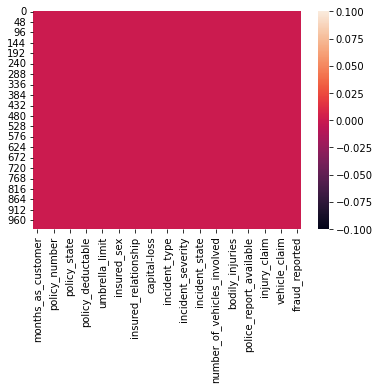

In [11]:
sns.heatmap(df1.isnull())

In [12]:
df1.duplicated().sum()   #To get duplicates in the data

0

In [13]:
df1.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_hobbies', 'insured_relationship', 'capital-gains',
       'capital-loss', 'incident_date', 'incident_type', 'collision_type',
       'incident_severity', 'authorities_contacted', 'incident_state',
       'incident_city', 'number_of_vehicles_involved', 'property_damage',
       'bodily_injuries', 'witnesses', 'police_report_available',
       'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim',
       'auto_make', 'fraud_reported'],
      dtype='object')

# Finding unique values 

In [14]:
for column in df1.columns:
    if df1[column].dtype==object:
        print(str(column)+':'+str(df1[column].unique()))
        print(str(column)+':'+str(df1[column].nunique()))
        print(df1[column].value_counts())
        print("-------------------------------------------")


policy_bind_date:['17-10-2014' '27-06-2006' '06-09-2000' '25-05-1990' '06-06-2014'
 '12-10-2006' '04-06-2000' '03-02-1990' '05-02-1997' '25-07-2011'
 '26-05-2002' '29-05-1999' '20-11-1997' '26-10-2012' '28-12-1998'
 '19-10-1992' '08-06-2005' '15-11-2004' '28-12-2014' '02-08-1992'
 '25-06-2002' '27-11-2005' '27-05-1994' '08-02-1991' '02-02-1996'
 '05-12-2013' '20-09-1990' '18-07-2002' '08-02-1990' '04-03-2014'
 '18-02-2000' '19-06-2008' '01-08-2003' '04-04-1992' '13-01-1991'
 '08-08-2010' '09-03-2003' '03-02-1993' '25-11-2002' '27-07-1997'
 '08-05-1995' '30-08-2012' '30-04-2006' '13-04-2003' '05-12-2007'
 '21-08-2006' '08-01-1990' '18-03-1990' '07-01-2008' '10-03-1997'
 '10-01-2004' '20-08-1994' '02-06-2002' '28-04-1994' '17-08-2014'
 '11-08-2007' '20-11-2008' '18-10-1995' '19-05-1993' '26-02-2005'
 '14-02-1990' '30-09-1993' '10-06-2014' '28-10-2008' '24-04-2007'
 '13-12-1993' '17-08-2011' '20-08-1990' '11-02-1994' '22-02-1994'
 '15-08-2011' '11-11-1998' '04-12-1995' '28-12-2002' '15-04

# Data visualization

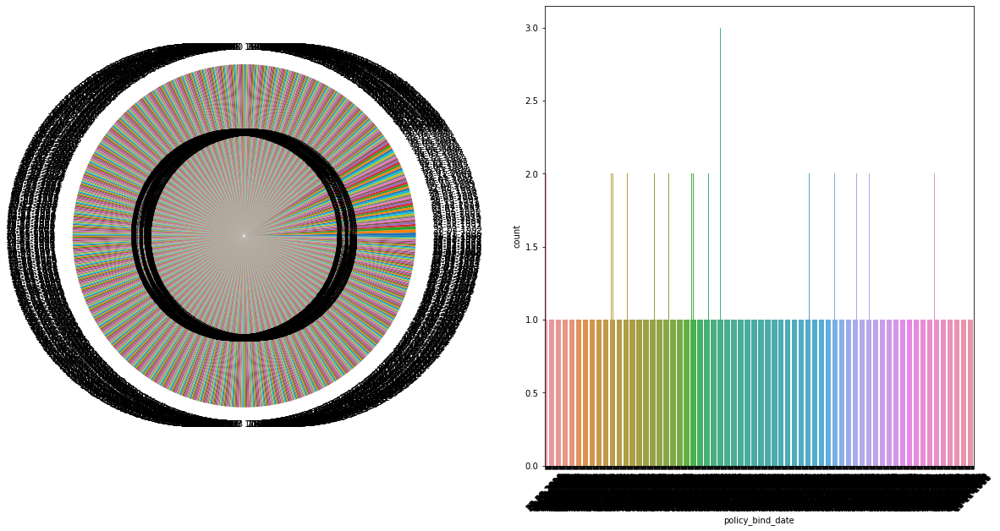

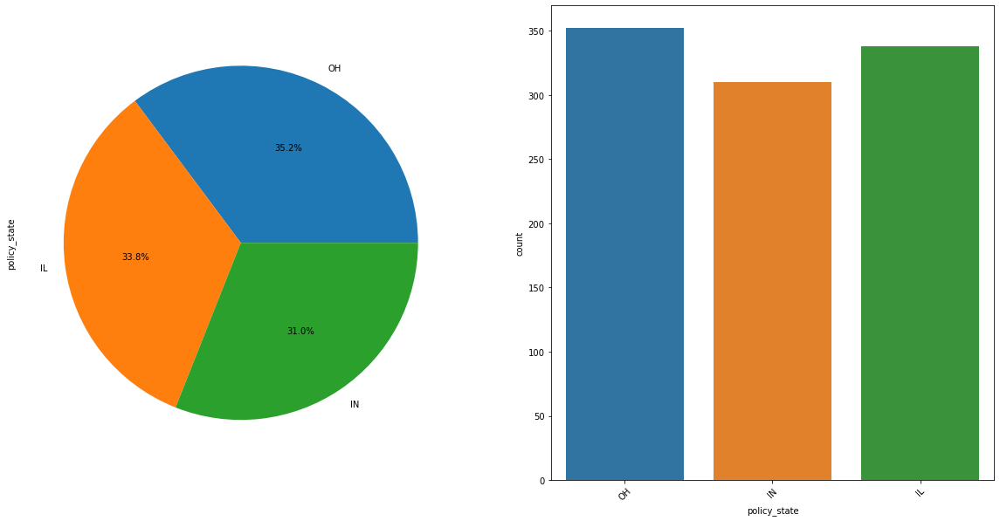

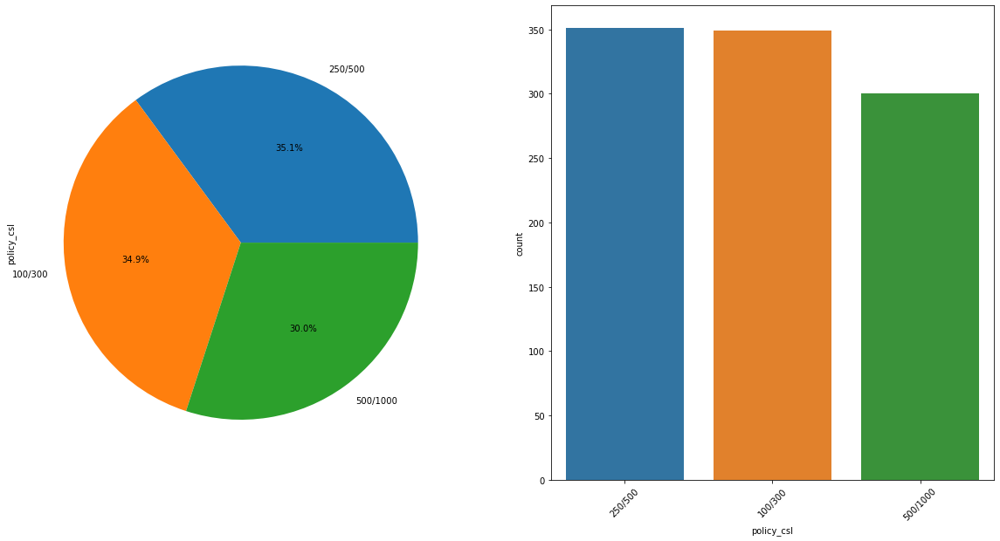

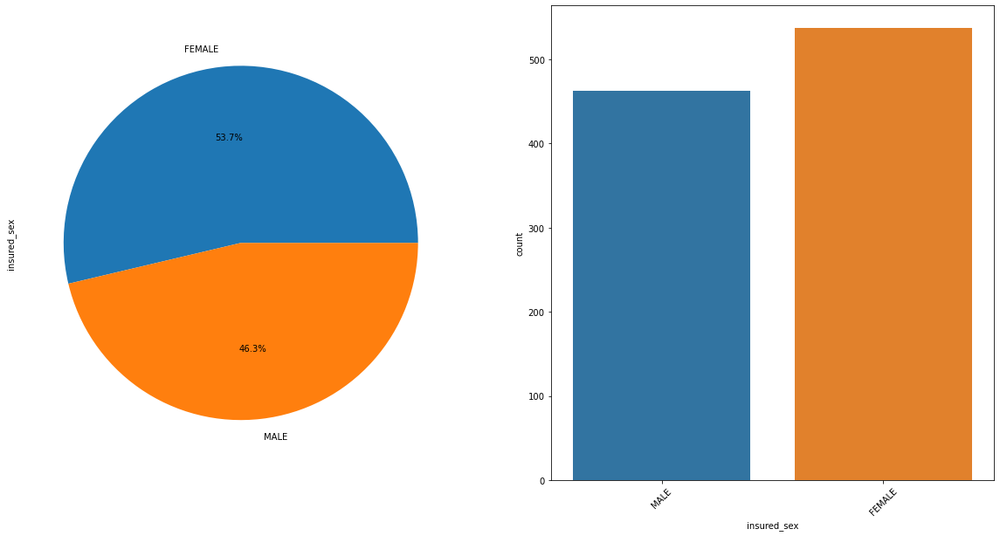

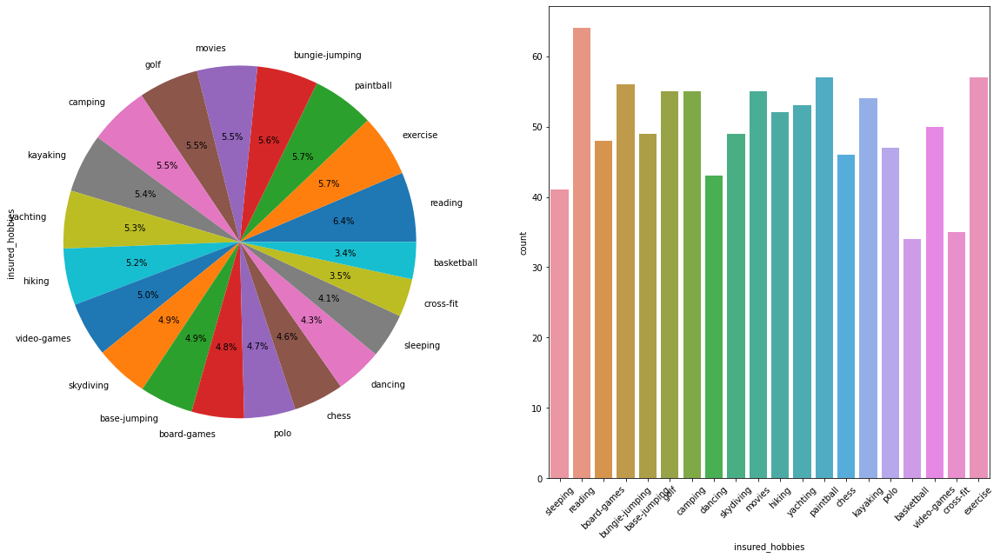

...

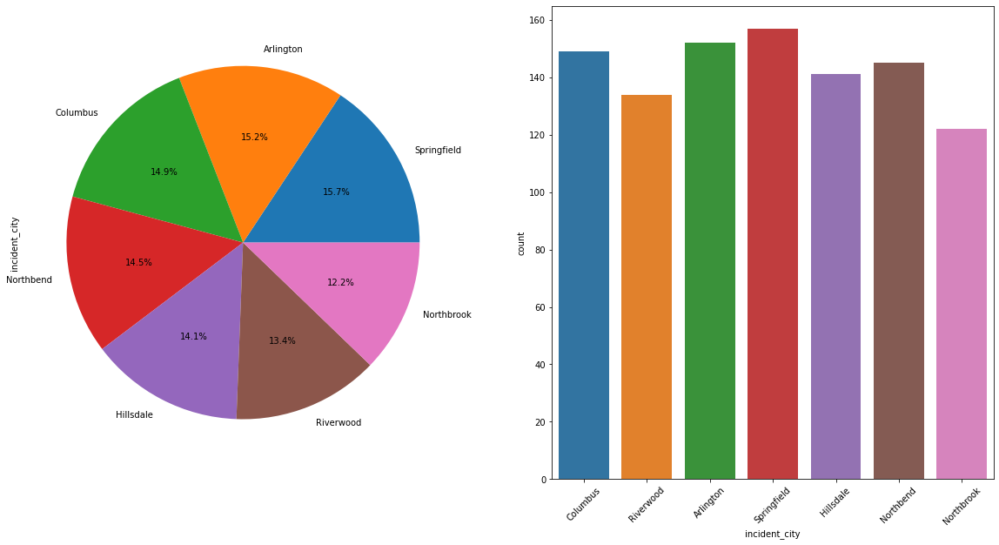

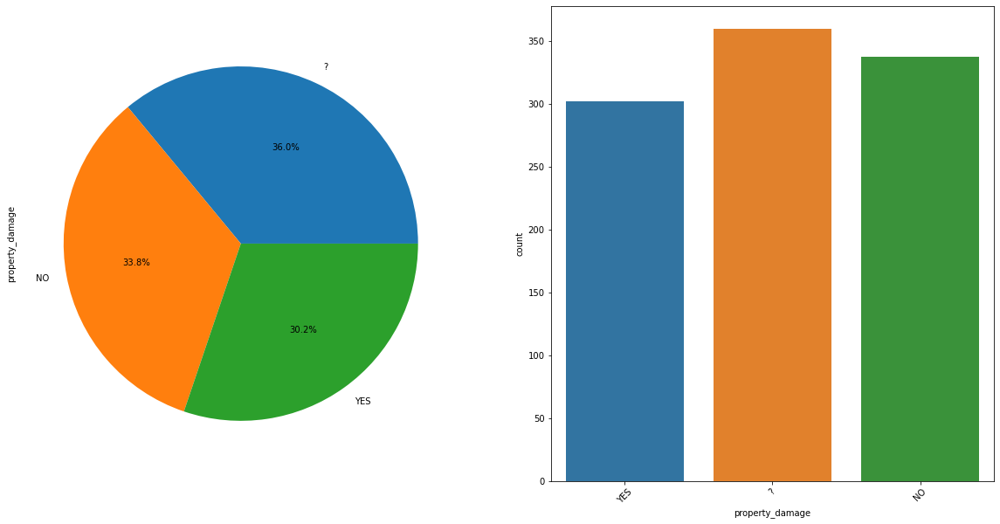

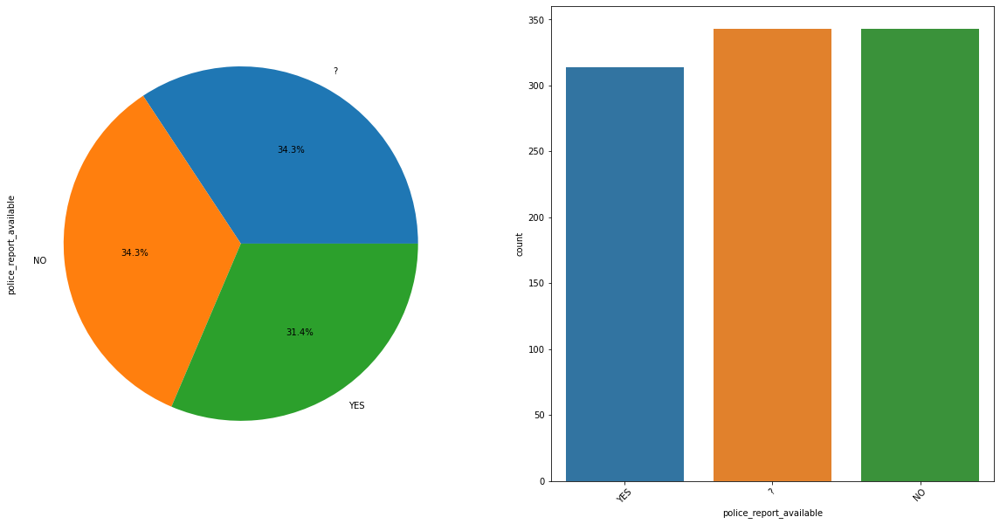

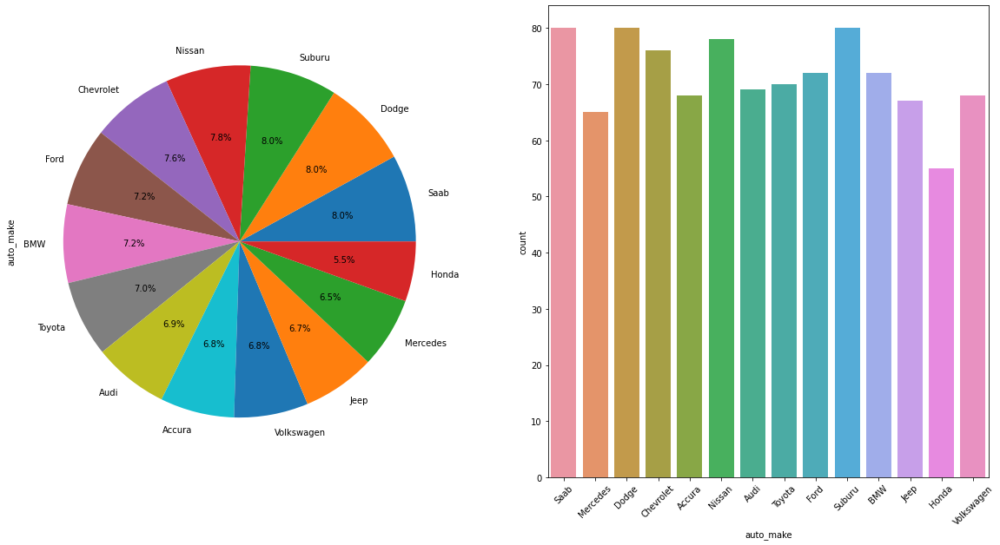

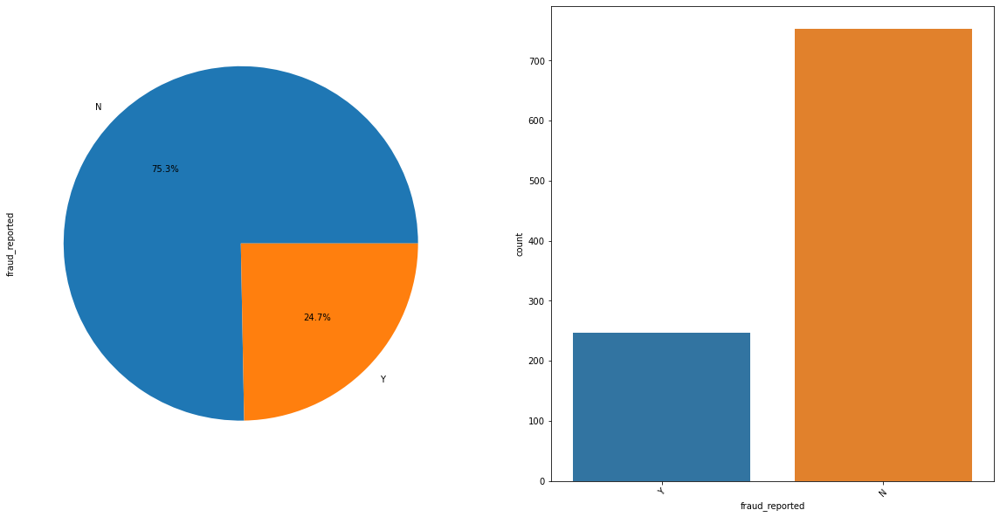

In [15]:
for column in df1.columns:
    if df1[column].dtype==object:
        plt.figure(figsize=(20,10))
        plt.subplot(1,2,1)
        df1[column].value_counts().plot.pie(autopct='%1.1f%%')
        plt.subplot(1,2,2)
        sns.countplot(df1[column])
        plt.xticks(Rotation=45)
        df1[column].value_counts()

(array([-20000.,      0.,  20000.,  40000.,  60000.,  80000., 100000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

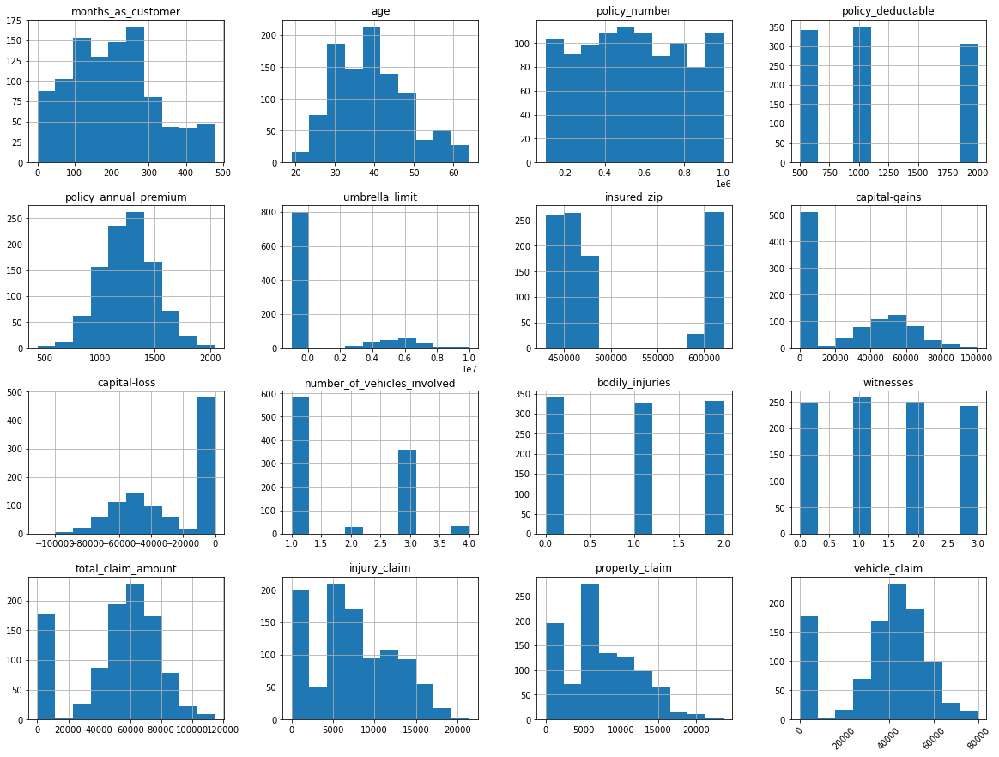

In [16]:
df1.hist(figsize=(20,15))
plt.xticks(Rotation=45)

# Encoding Data using LabelEncoder

In [17]:
LE=LabelEncoder()
for column in df1.columns:
    if df1[column].dtype==object:
        df1[column]=LE.fit_transform(df1[column])
df1

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,fraud_reported
0,328,48,521585,532,2,1,1000,1406.91,0,466132,...,2,1,2,2,71610,6510,13020,52080,10,1
1,228,42,342868,821,1,1,2000,1197.22,5000000,468176,...,0,0,0,0,5070,780,780,3510,8,1
2,134,29,687698,186,2,0,2000,1413.14,5000000,430632,...,1,2,3,1,34650,7700,3850,23100,4,0
3,256,41,227811,766,0,1,2000,1415.74,6000000,608117,...,0,1,2,1,63400,6340,6340,50720,3,1
4,228,44,367455,181,0,2,1000,1583.91,6000000,610706,...,1,0,1,1,6500,1300,650,4550,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,487,2,2,1000,1310.80,0,431289,...,2,0,1,0,87200,17440,8720,61040,6,0
996,285,41,186934,129,0,0,1000,1436.79,0,608177,...,2,2,3,0,108480,18080,18080,72320,13,0
997,130,34,918516,509,2,1,500,1383.49,3000000,442797,...,0,2,3,2,67500,7500,7500,52500,11,0
998,458,62,533940,573,0,2,2000,1356.92,5000000,441714,...,0,0,1,2,46980,5220,5220,36540,1,0


In [18]:
df1.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                 int32
policy_state                     int32
policy_csl                       int32
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                      int32
insured_hobbies                  int32
insured_relationship             int32
capital-gains                    int64
capital-loss                     int64
incident_date                    int32
incident_type                    int32
collision_type                   int32
incident_severity                int32
authorities_contacted            int32
incident_state                   int32
incident_city                    int32
number_of_vehicles_involved      int64
property_damage                  int32
bodily_injuries                  int64
witnesses                

In [19]:
df1.corr()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,fraud_reported
months_as_customer,1.000000,0.922098,0.057555,0.055055,-0.000328,-0.026819,0.026807,0.005018,0.015498,0.017895,...,0.007040,-0.010162,0.058383,0.017647,0.062108,0.065329,0.034940,0.061013,0.047655,0.020544
age,0.922098,1.000000,0.059413,0.056538,-0.014533,-0.015185,0.029188,0.014404,0.018126,0.025604,...,-0.001486,-0.015679,0.052359,0.014661,0.069863,0.075522,0.060898,0.062588,0.030410,0.012143
policy_number,0.057555,0.059413,1.000000,0.045713,0.072815,0.038917,-0.006738,0.022566,0.008968,0.007083,...,0.005575,-0.004558,-0.012661,0.032019,-0.018009,-0.008762,-0.010678,-0.020184,0.023860,-0.029443
policy_bind_date,0.055055,0.056538,0.045713,1.000000,0.015289,0.008486,-0.001721,-0.037733,-0.024866,-0.042749,...,-0.011615,-0.046970,-0.007004,-0.034920,0.015901,0.024160,0.008611,0.013784,-0.025955,0.060642
policy_state,-0.000328,-0.014533,0.072815,0.015289,1.000000,0.001027,0.010033,0.012455,-0.029580,0.008777,...,0.008623,0.013384,0.022960,0.071950,-0.006002,-0.046290,0.008406,0.001425,0.017124,0.029432
policy_csl,-0.026819,-0.015185,0.038917,0.008486,0.001027,1.000000,0.003384,0.023978,0.021636,0.006879,...,-0.027340,-0.000595,0.071500,0.002424,-0.055758,-0.078818,-0.042216,-0.046791,-0.004701,-0.037190
policy_deductable,0.026807,0.029188,-0.006738,-0.001721,0.010033,0.003384,1.000000,-0.003245,0.010870,0.004545,...,0.016900,-0.022765,0.066639,0.030166,0.022839,0.039107,0.064792,0.005269,-0.035379,0.014817
policy_annual_premium,0.005018,0.014404,0.022566,-0.037733,0.012455,0.023978,-0.003245,1.000000,-0.006247,0.032354,...,0.095359,0.026780,0.002332,0.013624,0.009094,-0.017633,-0.011654,0.020246,0.000045,-0.014480
umbrella_limit,0.015498,0.018126,0.008968,-0.024866,-0.029580,0.021636,0.010870,-0.006247,1.000000,0.019671,...,-0.056957,0.022743,-0.006738,-0.055951,-0.040344,-0.045412,-0.023790,-0.038584,-0.004443,0.058622
insured_zip,0.017895,0.025604,0.007083,-0.042749,0.008777,0.006879,0.004545,0.032354,0.019671,1.000000,...,0.060342,0.028695,0.019805,-0.017607,-0.033873,-0.017495,-0.006841,-0.041083,-0.020892,0.019368


Text(0.5, 1.0, 'Correlation Matrix')

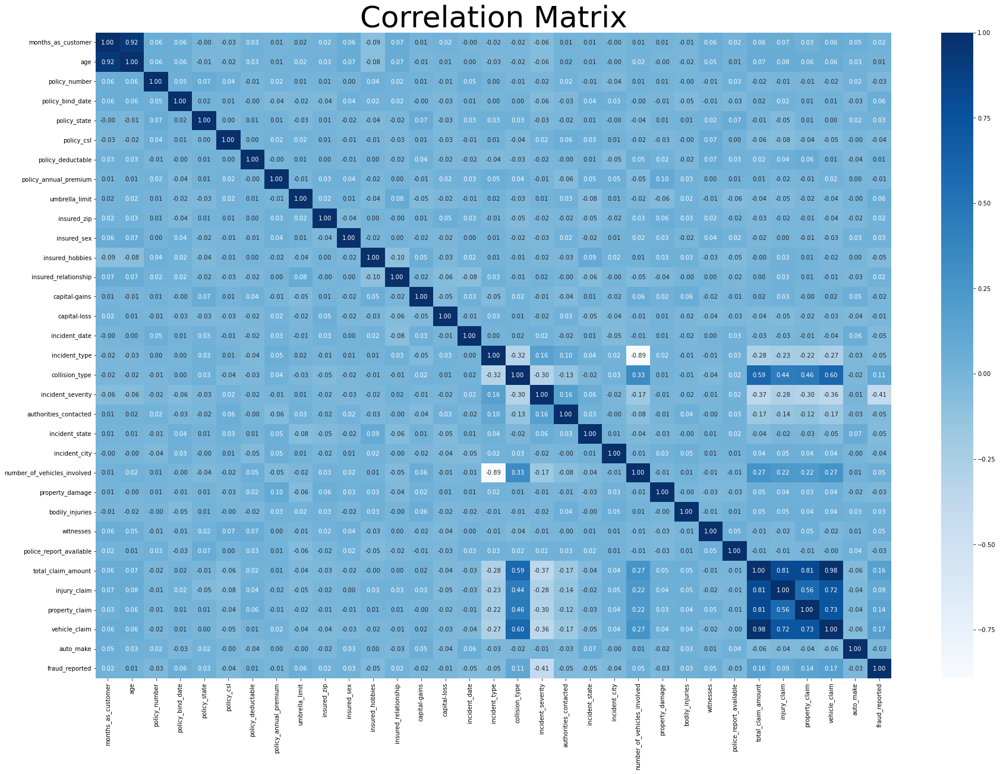

In [20]:
plt.figure(figsize=(30,20))
sns.heatmap(df1.corr(),annot=True,fmt='0.2f',cmap='Blues')
plt.title('Correlation Matrix',fontsize=50)

# Distribution Plot

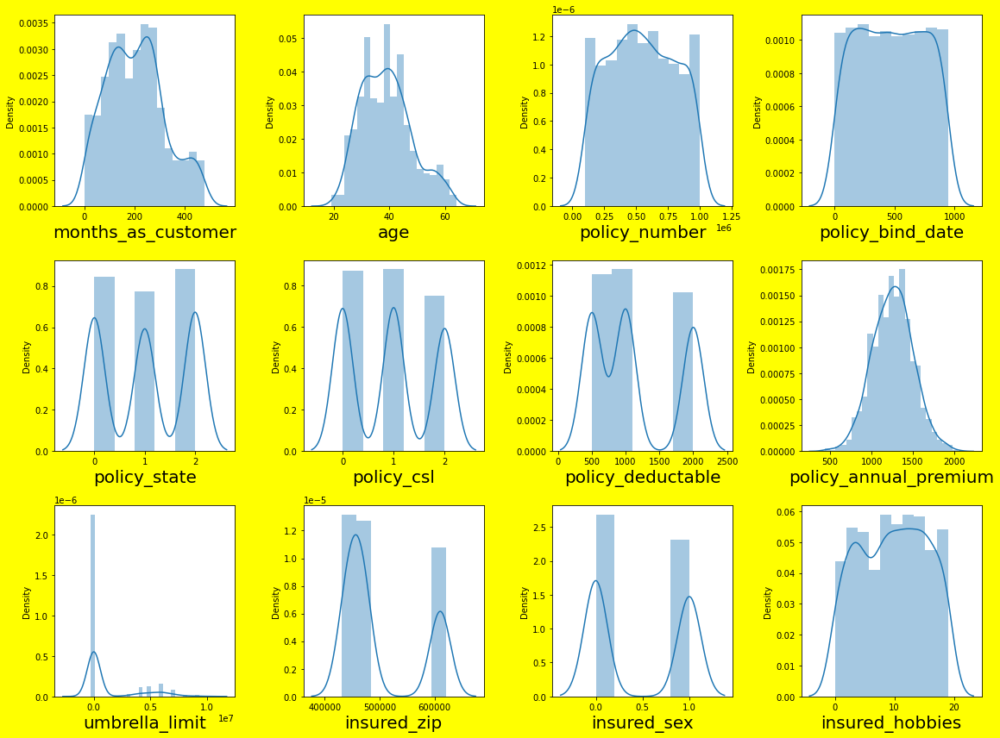

In [21]:
plt.figure(figsize=(16,12),facecolor='yellow')
plotnumber=1
for column in df1:
    if plotnumber<=12:
        ax=plt.subplot(3,4,plotnumber)
        sns.distplot(df1[column])
        plt.xlabel(column,fontsize=20)
        
        plotnumber+=1
    plt.tight_layout()

# Finding skewness in the data

array([[<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>],
       [<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>],
       [<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>],
       [<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>],
       [<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel=

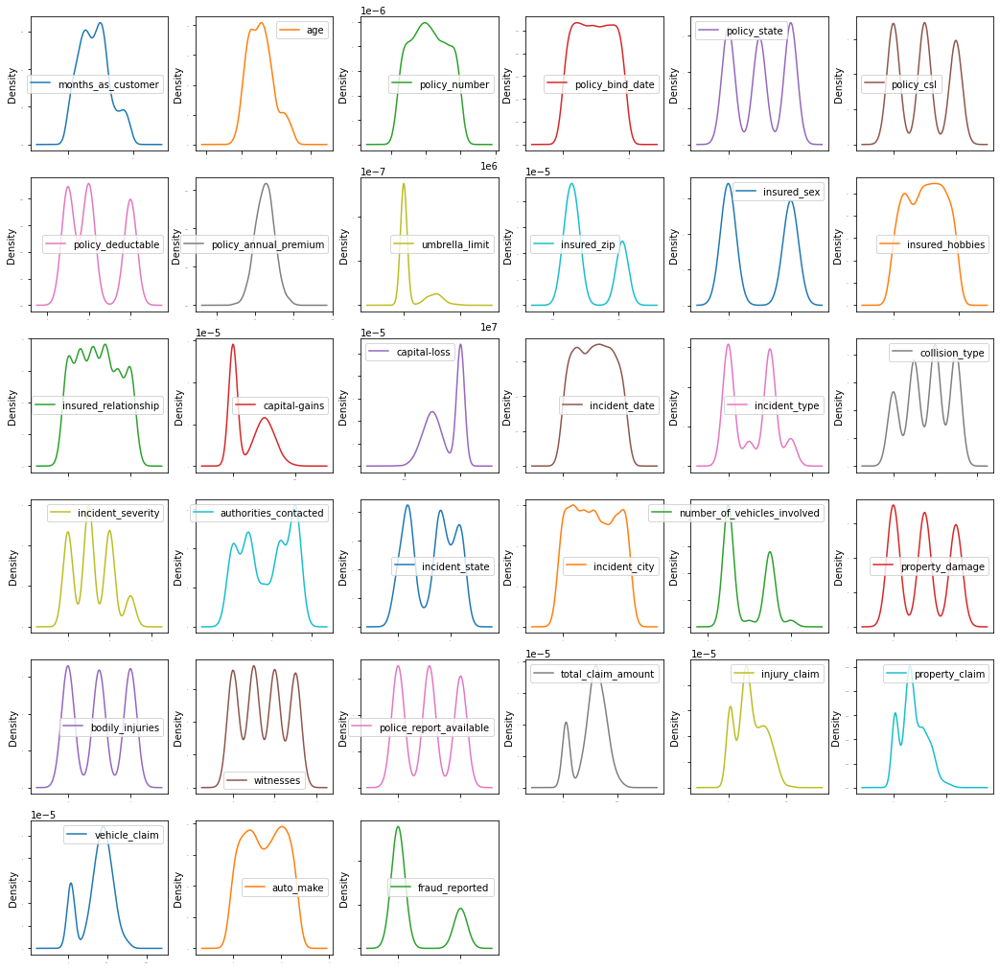

In [22]:
df1.plot(kind='density',subplots=True,layout=(6,6),sharex=False,figsize=(18,18),fontsize=1,legend=True)

# Multicollinearity

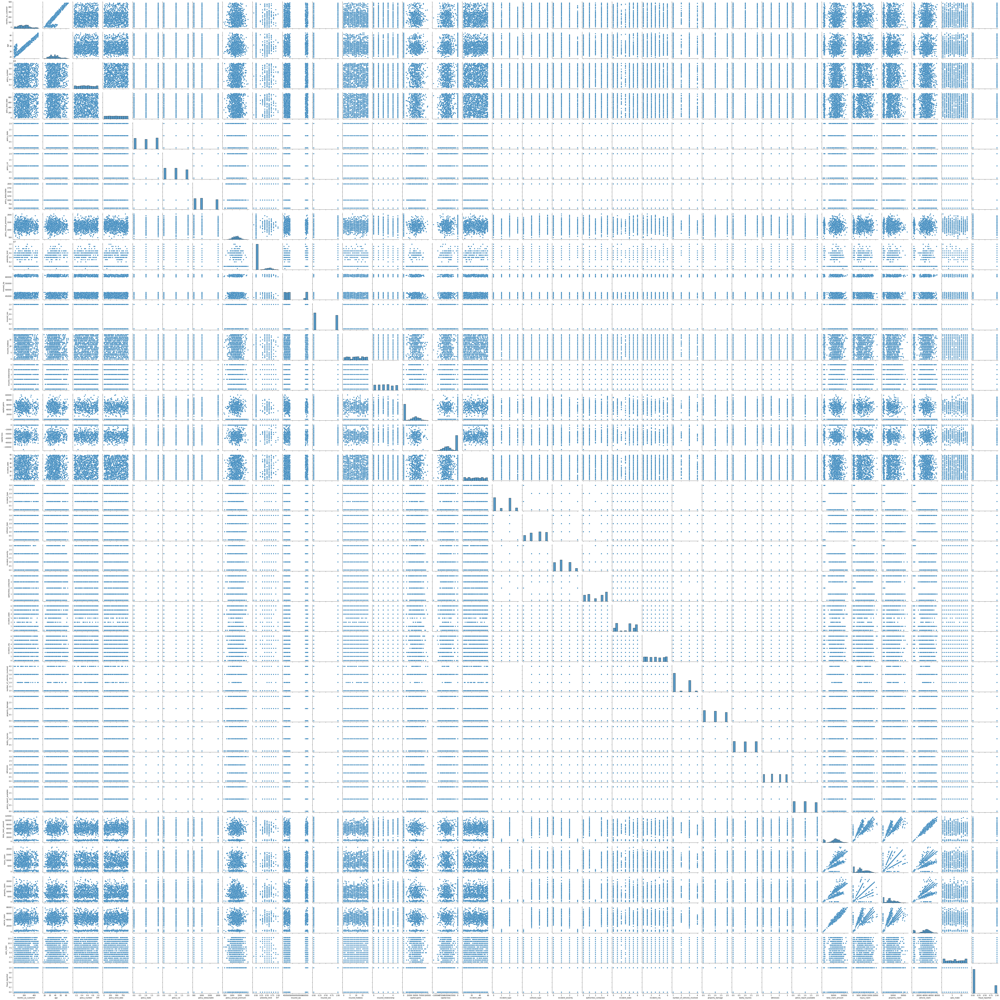

In [23]:
sns.pairplot(df1)

# Finding Outliers using Box Plot

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33]),
 [Text(1, 0, 'months_as_customer'),
  Text(2, 0, 'age'),
  Text(3, 0, 'policy_number'),
  Text(4, 0, 'policy_bind_date'),
  Text(5, 0, 'policy_state'),
  Text(6, 0, 'policy_csl'),
  Text(7, 0, 'policy_deductable'),
  Text(8, 0, 'policy_annual_premium'),
  Text(9, 0, 'umbrella_limit'),
  Text(10, 0, 'insured_zip'),
  Text(11, 0, 'insured_sex'),
  Text(12, 0, 'insured_hobbies'),
  Text(13, 0, 'insured_relationship'),
  Text(14, 0, 'capital-gains'),
  Text(15, 0, 'capital-loss'),
  Text(16, 0, 'incident_date'),
  Text(17, 0, 'incident_type'),
  Text(18, 0, 'collision_type'),
  Text(19, 0, 'incident_severity'),
  Text(20, 0, 'authorities_contacted'),
  Text(21, 0, 'incident_state'),
  Text(22, 0, 'incident_city'),
  Text(23, 0, 'number_of_vehicles_involved'),
  Text(24, 0, 'property_damage'),
  Text(25, 0, 'bodily_injuries'),
  Text(26, 0, 'w

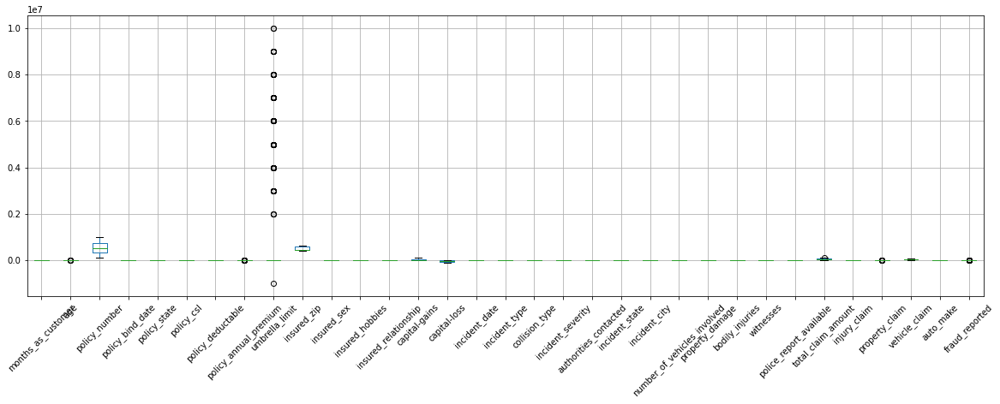

In [24]:
df1.boxplot(figsize=(20,12))
plt.subplots_adjust(bottom=0.5)
plt.xticks(Rotation=45)

In [25]:
(np.abs(zscore(df1)<3)).all()

months_as_customer              True
age                             True
policy_number                   True
policy_bind_date                True
policy_state                    True
policy_csl                      True
policy_deductable               True
policy_annual_premium          False
umbrella_limit                 False
insured_zip                     True
insured_sex                     True
insured_hobbies                 True
insured_relationship            True
capital-gains                   True
capital-loss                    True
incident_date                   True
incident_type                   True
collision_type                  True
incident_severity               True
authorities_contacted           True
incident_state                  True
incident_city                   True
number_of_vehicles_involved     True
property_damage                 True
bodily_injuries                 True
witnesses                       True
police_report_available         True
t

In [26]:
df1.skew()

months_as_customer             0.362177
age                            0.478988
policy_number                  0.038991
policy_bind_date               0.005194
policy_state                  -0.026177
policy_csl                     0.088928
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.816554
insured_sex                    0.148630
insured_hobbies               -0.061563
insured_relationship           0.077488
capital-gains                  0.478850
capital-loss                  -0.391472
incident_date                  0.004756
incident_type                  0.101507
collision_type                -0.193345
incident_severity              0.279016
authorities_contacted         -0.121744
incident_state                -0.148865
incident_city                  0.049531
number_of_vehicles_involved    0.502664
property_damage                0.106418
bodily_injuries                0.014777


# Removing Outliers

In [27]:
scores = np.abs(zscore(df1))
t = 3
np.where(scores<3)

(array([  0,   0,   0, ..., 999, 999, 999], dtype=int64),
 array([ 0,  1,  2, ..., 30, 31, 32], dtype=int64))

In [28]:
new_df = df1[(scores<3).all(axis=1)]
print(df1.shape)
print(new_df.shape)

(1000, 33)
(980, 33)


* After removing outliers in the data 980 rows of values left and remaining 20 no.of data we lost

# Scatter Plot relationship

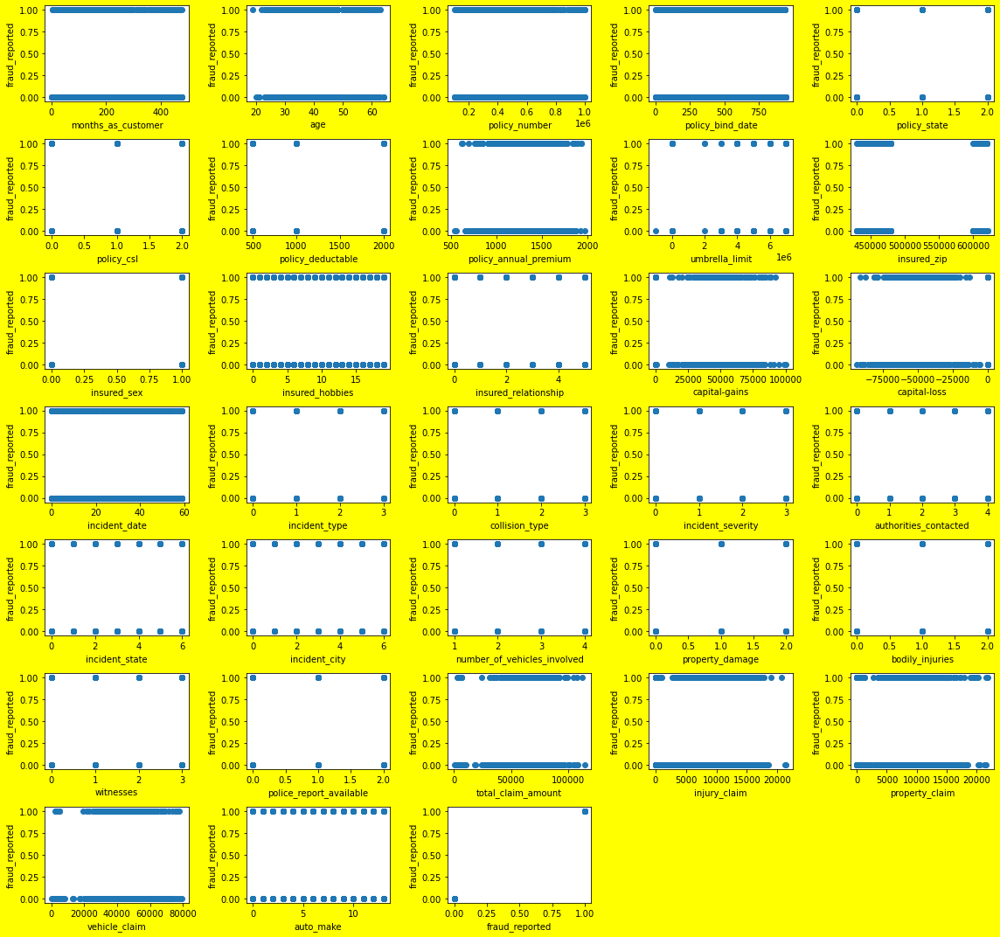

In [29]:
plt.figure(figsize=(16,15),facecolor='yellow')
plotnumber=1
for column in new_df:
    if plotnumber<=35:
        ax=plt.subplot(7,5,plotnumber)
        plt.scatter(new_df[column],new_df['fraud_reported'])
        plt.xlabel(column,fontsize=10)
        plt.ylabel('fraud_reported',fontsize=10)
        
        plotnumber+=1
    plt.tight_layout()

# Spltting features and labels

In [30]:
x=df1.drop('fraud_reported',axis=1)
y=df1['fraud_reported']
y

0      1
1      1
2      0
3      1
4      0
      ..
995    0
996    0
997    0
998    0
999    0
Name: fraud_reported, Length: 1000, dtype: int32

# Pre-Processing model

# Scaling Data

In [31]:
std=StandardScaler()
x_scaled=pd.DataFrame(std.fit_transform(x),columns=x.columns)
x_scaled

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make
0,1.078140,0.990836,-0.095953,0.209500,1.187173,0.060937,-0.222383,0.616705,-0.479476,-0.489529,...,-0.823865,1.303656,0.009759,0.461838,1.270313,0.714257,-0.189283,1.165505,0.749653,0.856466
1,0.208995,0.334073,-0.791527,1.259397,-0.016856,0.060937,1.412784,-0.242521,1.697980,-0.461008,...,-0.823865,-1.160722,-1.210174,-1.338700,-1.198712,-1.807312,-1.363822,-1.372696,-1.823346,0.360539
2,-0.608002,-1.088913,0.550566,-1.047470,1.187173,-1.182668,1.412784,0.642233,1.697980,-0.984885,...,1.140056,0.071467,1.229693,1.362107,0.035801,-0.686362,0.054644,-0.736072,-0.785565,-0.631315
3,0.452355,0.224613,-1.239334,1.059589,-1.220886,0.060937,1.412784,0.652886,2.133471,1.491682,...,-0.823865,-1.160722,0.009759,0.461838,0.035801,0.403135,-0.224130,-0.219722,0.677607,-0.879279
4,0.208995,0.552994,-0.695834,-1.065634,-1.220886,1.304542,-0.222383,1.341980,2.133471,1.527808,...,-0.823865,0.071467,-1.210174,-0.438431,0.035801,-1.753121,-1.257232,-1.399654,-1.768252,-1.623169
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-1.746582,-0.103769,1.539740,0.046021,1.187173,1.304542,-0.222383,0.222884,-0.479476,-0.975717,...,-0.823865,1.303656,-1.210174,-0.438431,-1.198712,1.305049,2.051155,0.273817,1.224309,-0.135388
996,0.704407,0.224613,-1.398429,-1.254543,-1.220886,-1.182668,-0.222383,0.739141,-0.479476,1.492519,...,-0.823865,1.303656,1.229693,1.362107,-1.198712,2.111466,2.182342,2.214794,1.821868,1.600357
997,-0.642767,-0.541611,1.448920,0.125944,1.187173,0.060937,-1.039966,0.520739,0.826998,-0.815138,...,1.140056,-1.160722,1.229693,1.362107,1.270313,0.558507,0.013648,0.020826,0.771902,1.104430
998,2.208028,2.523284,-0.047867,0.358447,-1.220886,1.304542,1.412784,0.411866,1.697980,-0.830250,...,-0.823865,-1.160722,-1.210174,-0.438431,1.270313,-0.219110,-0.453708,-0.451976,-0.073580,-1.375206


# Building Model

# Finding Best Random State

In [32]:
bestrandom=0
max_score=0
#models=[LogisticRegression(),KNeighborsClassifier(),DecisionTreeClassifier(),RandomForestClassifier()]
for i in range(0,500):
    x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=0.20,random_state=i)
    LR=LogisticRegression()
    LR.fit(x_train,y_train)
    predrf=LR.predict(x_test)
    acc=accuracy_score(y_test,predrf)*100
    print('Accuracy score is ',acc,'Random state',i)
    
    if acc>max_score:
        max_score=acc
        bestrandom=i
            
        print('Accuracy',max_score,'Random State',i)

Accuracy score is  76.0 Random state 0
Accuracy 76.0 Random State 0
Accuracy score is  77.0 Random state 1
Accuracy 77.0 Random State 1
Accuracy score is  80.5 Random state 2
Accuracy 80.5 Random State 2
Accuracy score is  77.5 Random state 3
Accuracy score is  72.5 Random state 4
Accuracy score is  78.5 Random state 5
Accuracy score is  80.5 Random state 6
Accuracy score is  76.0 Random state 7
Accuracy score is  78.5 Random state 8
Accuracy score is  79.0 Random state 9
Accuracy score is  77.0 Random state 10
Accuracy score is  73.0 Random state 11
Accuracy score is  78.5 Random state 12
Accuracy score is  81.0 Random state 13
Accuracy 81.0 Random State 13
Accuracy score is  77.0 Random state 14
Accuracy score is  77.5 Random state 15
Accuracy score is  82.5 Random state 16
Accuracy 82.5 Random State 16
Accuracy score is  77.5 Random state 17
Accuracy score is  81.0 Random state 18
Accuracy score is  78.5 Random state 19
Accuracy score is  80.5 Random state 20
Accuracy score is  70.0

In [33]:
print('Best Accuracy',max_score,'Best Random State',bestrandom)

Best Accuracy 85.0 Best Random State 65


# Train_test_split

In [34]:
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=20,random_state=64)

# Modeling

# Predicting Output using differeent models and Cross Validation score

In [35]:
models=[LogisticRegression(),KNeighborsClassifier(),DecisionTreeClassifier(),RandomForestClassifier(),GradientBoostingClassifier(),SVC()]
for model in models:
    model.fit(x_train,y_train)
    predlr=model.predict(x_test)
    print("Model Name",model)
    print("Accuracy",accuracy_score(y_test,predlr)*100)
    print(confusion_matrix(y_test,predlr))
    print(classification_report(y_test,predlr))
    print('----------------------------------------------------------')
    scr=cross_val_score(model,x_scaled,y,cv=5)
    print("Cross validation score is: ", scr.mean()*100)
    print("Mean score :", (scr.mean())*100)
    print("STD :", scr.std()*100)
    print('==========================================================')

Model Name LogisticRegression()
Accuracy 95.0
[[17  0]
 [ 1  2]]
              precision    recall  f1-score   support

           0       0.94      1.00      0.97        17
           1       1.00      0.67      0.80         3

    accuracy                           0.95        20
   macro avg       0.97      0.83      0.89        20
weighted avg       0.95      0.95      0.95        20

----------------------------------------------------------
Cross validation score is:  78.10000000000001
Mean score : 78.10000000000001
STD : 2.557342370508887
Model Name KNeighborsClassifier()
Accuracy 80.0
[[15  2]
 [ 2  1]]
              precision    recall  f1-score   support

           0       0.88      0.88      0.88        17
           1       0.33      0.33      0.33         3

    accuracy                           0.80        20
   macro avg       0.61      0.61      0.61        20
weighted avg       0.80      0.80      0.80        20

------------------------------------------------------

* Hence LogisticRegression model got a 95% accuracy score and 78% cross validation score
*  Decision Tree Classifier model given a accuracy score of 95% and cross validation score is 77%

# LogisticRegression model

In [36]:

LR=LogisticRegression()
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=20,random_state=64)
LR.fit(x_train,y_train)
predlr=LR.predict(x_test)
print("Model Name",LR)
print("Accuracy",accuracy_score(y_test,predlr)*100)
print(confusion_matrix(y_test,predlr))
print(classification_report(y_test,predlr))
print('----------------------------------------------------------')
scr=cross_val_score(LR,x_scaled,y,cv=5)
print("Cross validation score is: ", scr.mean()*100)
print("Mean score :", (scr.mean())*100)
print("STD :", scr.std()*100)
print('==========================================================')

Model Name LogisticRegression()
Accuracy 95.0
[[17  0]
 [ 1  2]]
              precision    recall  f1-score   support

           0       0.94      1.00      0.97        17
           1       1.00      0.67      0.80         3

    accuracy                           0.95        20
   macro avg       0.97      0.83      0.89        20
weighted avg       0.95      0.95      0.95        20

----------------------------------------------------------
Cross validation score is:  78.10000000000001
Mean score : 78.10000000000001
STD : 2.557342370508887


# HyperParameter Tuning using Best GridSearchCV Method

In [37]:
Min_Samples={'min_samples_leaf':[100,150,1000,1]}
dtc=DecisionTreeClassifier()
grid=GridSearchCV(estimator=dtc,param_grid=Min_Samples)
grid.fit(x_train,y_train)
print(grid)
print(grid.best_score_)
print(grid.best_estimator_.min_samples_leaf)
print(grid.best_params_)

GridSearchCV(estimator=DecisionTreeClassifier(),
             param_grid={'min_samples_leaf': [100, 150, 1000, 1]})
0.8071428571428572
150
{'min_samples_leaf': 150}


# DecisionTreeClassifer model

In [38]:
dtc=DecisionTreeClassifier(min_samples_leaf=150)
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=20,random_state=64)
dtc.fit(x_train,y_train)
predlr=LR.predict(x_test)
print("Model Name",dtc)
print("Accuracy",accuracy_score(y_test,predlr)*100)
print(confusion_matrix(y_test,predlr))
print(classification_report(y_test,predlr))
print('----------------------------------------------------------')
scr=cross_val_score(dtc,x_scaled,y,cv=5)
print("Cross validation score is: ", scr.mean()*100)
print("Mean score :", (scr.mean())*100)
print("STD :", scr.std()*100)
print('==========================================================')

Model Name DecisionTreeClassifier(min_samples_leaf=150)
Accuracy 95.0
[[17  0]
 [ 1  2]]
              precision    recall  f1-score   support

           0       0.94      1.00      0.97        17
           1       1.00      0.67      0.80         3

    accuracy                           0.95        20
   macro avg       0.97      0.83      0.89        20
weighted avg       0.95      0.95      0.95        20

----------------------------------------------------------
Cross validation score is:  81.1
Mean score : 81.1
STD : 2.634387974463896


* Hence the DecisionTreeClassifer model is predicting output with 95% accuracy score with 81% cross validation score

# ROC-AUC Curve

Accuracy 100.0


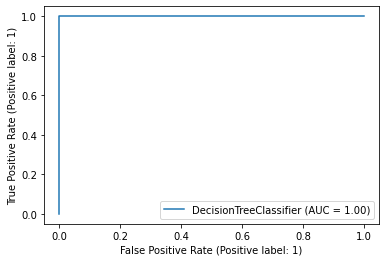

In [39]:
dtc=DecisionTreeClassifier(min_samples_leaf=150)
dtc.fit(x_train,y_train)
predlr=dtc.predict(x_test)
print("Accuracy",accuracy_score(y_test,predlr)*100)

plot_roc_curve(dtc, x_test, y_test) 
plt.show()

# Saving Model

In [40]:
filename = 'Insurance Fraud Analyser.pkl'
pickle.dump(dtc,open(filename,'wb'))